In [1]:
import sys
import xarray as xr
import numpy as np
import pandas as pd
import math
import glob
import yaml
import geopandas as gpd
import cartopy
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.colorbar import Colorbar # different way to handle colorbar
import matplotlib.ticker as mticker
import cmocean.cm as cmo

# cartopy
import cartopy.crs as ccrs
from cartopy.mpl.geoaxes import GeoAxes
import cartopy.feature as cfeature
import dask

# import personal modules
# Path to modules
sys.path.append('../modules')
# Import my modules
from utils import roundPartial, select_months_ds
from plotter import draw_basemap, plot_terrain, plot_arscale_cbar
from colorline import colorline
from trajectory_post_funcs import calculate_heatmaps_from_trajectories
import customcmaps as ccmap

dask.config.set(**{'array.slicing.split_large_chunks': True})

ERROR 1: PROJ: proj_create_from_database: Open of /home/dnash/miniconda3/envs/SEAK-impacts/share/proj failed


In [2]:
path_to_data = '/expanse/nfs/cw3e/cwp140/'
path_to_out  = '../out/'       # output files (numerical results, intermediate datafiles) -- read & write
path_to_figs = '../figs/'      # figures

In [14]:
HUC8_ID_lst = ['14010001', '14080101', '14050001'] ## Colorado Headwaters and Upper San Juan
HUC8_lbl_lst = ['Colorado Headwaters', 'Upper San Juan', 'Upper Yampa']

ds_lst = []
for i, HUC8_ID in enumerate(HUC8_ID_lst):
    fname = path_to_data + 'preprocessed/UCRB_trajectories/combined/PRISM_HUC8_{0}.nc'.format(HUC8_ID)
    ds = xr.open_dataset(fname)
    ds['ar_scale'] = ds.ar_scale.fillna(0)
    ds_lst.append(ds)
    ndays_ar = len(ds.where(ds.ar_scale > 0, drop=True).start_date)
    ndays = len(ds.start_date)
    print(ndays, ndays_ar)

ds_lst[0]

1859 497
1310 410
2056 515


<xarray.Dataset>
Dimensions:             (index: 72, start_date: 1859)
Coordinates:
  * index               (index) int64 0 1 2 3 4 5 6 7 ... 65 66 67 68 69 70 71
    time                (start_date, index) datetime64[ns] ...
  * start_date          (start_date) datetime64[ns] 2000-01-05 ... 2023-12-24
    lon                 (start_date, index) float64 ...
    lat                 (start_date, index) float64 ...
Data variables: (12/18)
    level               (start_date, index) float64 ...
    q                   (start_date, index) float64 ...
    u                   (start_date, index) float64 ...
    v                   (start_date, index) float64 ...
    w                   (start_date, index) float64 ...
    IVT                 (start_date, index) float64 ...
    ...                  ...
    tARget_strict       (start_date) float64 ...
    coastal_IVT_strict  (start_date) float64 ...
    ar_scale            (start_date) float64 2.0 2.0 0.0 3.0 ... 3.0 3.0 3.0 0.0
    coastal_IVT         (start_date) float64 ...
    ar                  (start_date) float64 ...
    tARget              (start_date) float64 ...

In [4]:
## compute heatmaps
cell_lst = []
cell_lst2 = []

for i, ds in enumerate(ds_lst):
    print('Selecting AR days only')
    AR = ds.load().where(ds.ar_scale > 0, drop=True)
    tmp = ds.load().where((ds.ar_scale == 0), drop=True)
    
    ## now calculate heatmaps from remaining trajectories
    print('computing frequency for ARs')
    cell = calculate_heatmaps_from_trajectories(AR, normalize=False)
    print('computing frequency for non ARs')
    cell2 = calculate_heatmaps_from_trajectories(tmp, normalize=False)
    
    # AR = ds.where(ds.ar_scale > 0, drop=True)
    # cell = calculate_heatmaps_from_trajectories(HUC8_ID)
    cell_lst.append(cell)
    cell_lst2.append(cell2)

Selecting AR days only
computing frequency for ARs
computing frequency for non ARs
Selecting AR days only
computing frequency for ARs
computing frequency for non ARs
Selecting AR days only
computing frequency for ARs
computing frequency for non ARs


In [5]:
fp = path_to_data + 'downloads/CO_HUC8/wbdhu8.shp'
polys = gpd.read_file(fp, crs="epsg:4326") # have to manually set the projection

polys_lst = []
for i, HUC8_ID in enumerate(HUC8_ID_lst):
    idx = (polys.HUC8 == HUC8_ID)
    polys_lst.append(polys[idx])

In [6]:
# # select WY
# NDJFMA = select_months_ds(final_ds, 11, 4)
# MJJASO = select_months_ds(final_ds, 5, 10)
# ds_lst = [NDJFMA, MJJASO]

# ## Select Season
# DJF = final_ds.sel(start_date=final_ds.start_date.dt.season=="DJF")
# MAM = final_ds.sel(start_date=final_ds.start_date.dt.season=="MAM")
# JJA = final_ds.sel(start_date=final_ds.start_date.dt.season=="JJA")
# SON = final_ds.sel(start_date=final_ds.start_date.dt.season=="SON")
# ds_lst = [DJF, MAM, JJA, SON]


In [7]:
# min_ivt = ds.IVT.min().values
# max_ivt = ds.IVT.max().values
# print(np.round(min_ivt), np.round(max_ivt))

# min_q = final_ds.q.min().values
# max_q = final_ds.q.max().values
# print(np.round(min_q), np.round(max_q))

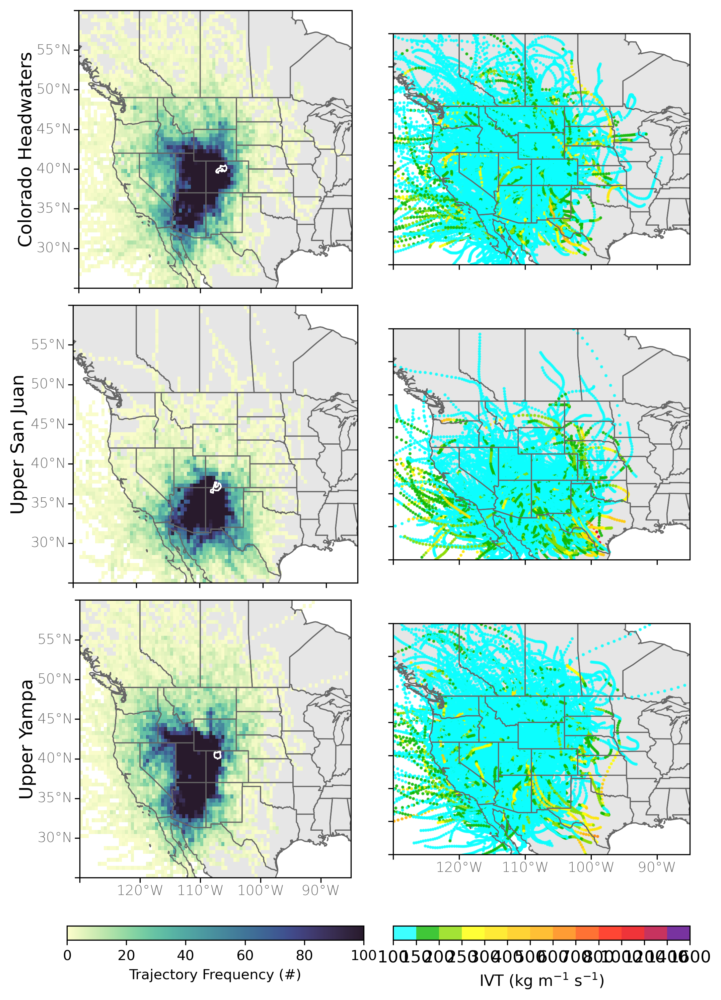

In [11]:
nrows = 5
ncols = 2

## Use gridspec to set up a plot with a series of subplots that is
## n-rows by n-columns
gs = GridSpec(nrows, ncols, height_ratios=[1, 1, 1, 0.05, 0.05], width_ratios = [1, 1], wspace=0.1, hspace=0.1)
## use gs[rows index, columns index] to access grids

fig = plt.figure(figsize=(8.0, 12.0))
fig.dpi = 300
fname = path_to_figs + 'ARScale_trajectory-IVT_heatmaps_noAR_UCRC'
fmt = 'png'
#####################
### PLOT HEATMAPS ###
#####################
# Set up projection
datacrs = ccrs.PlateCarree()  ## the projection the data is in
mapcrs = ccrs.PlateCarree() ## the projection you want your map displayed in
ext = [-130., -85., 25., 60.]
# Set tick/grid locations
tx = 10
ty = 5
dx = np.arange(ext[0],ext[1]+tx,tx)
dy = np.arange(ext[2],ext[3]+ty,ty)

# Add color bar axis
cbax = plt.subplot(gs[-1,0]) # colorbar axis

## create segmented cmap
cmap, norm, bnds = ccmap.cmap_segmented(cmo.deep, np.arange(0, 1.1, .1))

row_idx = [0, 1, 2]
col_idx = [0, 0, 0]
blon_lst = [False, False, True]
for i, cell2 in enumerate(cell_lst2):
    ax = fig.add_subplot(gs[row_idx[i],col_idx[i]], projection=mapcrs)
    ax = draw_basemap(ax, extent=ext, xticks=dx, yticks=dy, left_lats=True, right_lats=False, bottom_lons=blon_lst[i])
    ax.add_feature(cfeature.STATES, edgecolor='0.4', linewidth=0.8)

    # ## plotting based off of https://geopandas.org/en/stable/docs/user_guide/mapping.html
    # cf = cell2.plot(ax=ax, column='n_traj', cmap=cmap, vmin=bnds[0], vmax=bnds[-1], norm=norm, edgecolor=None, legend=True, cax=cbax,
    #               legend_kwds={"label": "Trajectory Frequency (normalized)", "orientation": "horizontal"})

    ## plotting based off of https://geopandas.org/en/stable/docs/user_guide/mapping.html
    cf = cell2.plot(ax=ax, column='n_traj', cmap=cmo.deep, vmin=0, vmax=100, edgecolor=None, legend=True, cax=cbax,
                  legend_kwds={"label": "Trajectory Frequency (#)", "orientation": "horizontal"})

    ## add in four focus watersheds
    polys_lst[i].plot(ax=ax, edgecolor='white', color='None', zorder=99)

    ax.text(-0.16, 0.5, HUC8_lbl_lst[i], va='bottom', ha='center',
                rotation='vertical', rotation_mode='anchor', fontsize=13,
                transform=ax.transAxes)

    ax.set_extent(ext, datacrs)

############################
### PLOT IVT VALUES ###
############################
row_idx = [0, 1, 2]
col_idx = [1, 1, 1]
blon_lst = [False, False, True]
for i, ds in enumerate(ds_lst):
    ax = fig.add_subplot(gs[row_idx[i],col_idx[i]], projection=mapcrs)
    ax = draw_basemap(ax, extent=ext, xticks=dx, yticks=dy, left_lats=False, right_lats=False, bottom_lons=blon_lst[i])
    ax.set_extent(ext, datacrs)
    
    ax.add_feature(cfeature.STATES, edgecolor='0.4', linewidth=0.8)
    AR = ds.where(ds.ar_scale == 0, drop=True)
    # need this to fix annotate transform
    # transform = datacrs._as_mpl_transform(ax)
    nevents = len(AR.start_date)
    ## Add different points
    for i in range(nevents):
        data = AR.isel(start_date=i)
        y_lst = data.lat.values
        x_lst = data.lon.values
        z_lst = data.IVT.values
        # ax.plot(x_lst, y_lst, c='gray', transform=datacrs, alpha=0.2)
        cmap, norm, bnds = ccmap.cmap('ivt')
        cf = ax.scatter(x_lst, y_lst, c=z_lst, cmap=cmap, norm=norm, marker='.', transform=datacrs, alpha=0.8, s=6)

# Add color bar
cbarticks = [100, 150, 200, 250, 300, 400, 500, 600, 700, 800, 1000, 1200, 1400, 1600]
cbax = plt.subplot(gs[-1,1]) # colorbar axis
cb = Colorbar(ax = cbax, mappable = cf, orientation = 'horizontal', ticklocation = 'bottom', ticks=cbarticks)
cb.set_label('IVT (kg m$^{-1}$ s$^{-1}$)', fontsize=11)
cb.ax.tick_params(labelsize=12)

fig.savefig('%s.%s' %(fname, fmt), bbox_inches='tight', dpi=fig.dpi, transparent=True)
plt.show()
fig.clf()

j 1 323


/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords,

j 2 125


/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords,

j 3 42


/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


j 4 6
j 5 1
j 1 296


/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords,

j 2 87


/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords,

j 3 19
j 4 6
j 5 2
j 1 312


/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords,

j 2 150


/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords,

j 3 47


/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords,

j 4 3
j 5 3


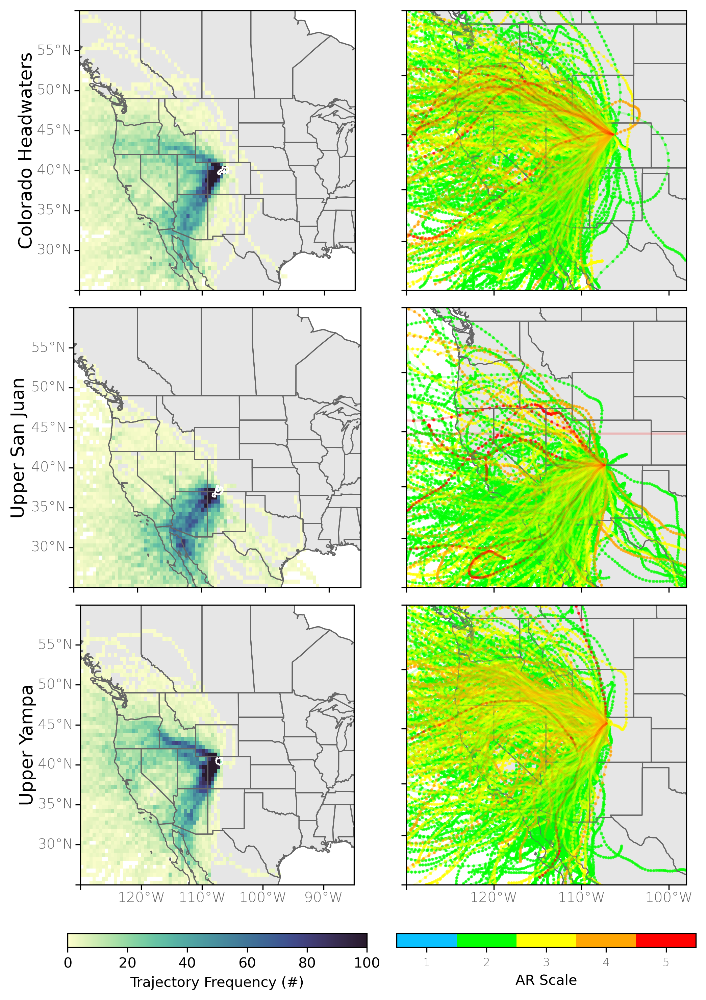

In [13]:
nrows = 5
ncols = 2

## Use gridspec to set up a plot with a series of subplots that is
## n-rows by n-columns
gs = GridSpec(nrows, ncols, height_ratios=[1, 1, 1, 0.05, 0.05], width_ratios = [1, 1], wspace=0.1, hspace=0.1)
## use gs[rows index, columns index] to access grids

fig = plt.figure(figsize=(8.0, 12.0))
fig.dpi = 300
fname = path_to_figs + 'ARScale_trajectory-IVT_heatmaps_yesAR_UCRC'
fmt = 'png'
#####################
### PLOT HEATMAPS ###
#####################
# Set up projection
datacrs = ccrs.PlateCarree()  ## the projection the data is in
mapcrs = ccrs.PlateCarree() ## the projection you want your map displayed in
ext = [-130., -85., 25., 60.]
# Set tick/grid locations
tx = 10
ty = 5
dx = np.arange(ext[0],ext[1]+tx,tx)
dy = np.arange(ext[2],ext[3]+ty,ty)

# Add color bar axis
cbax = plt.subplot(gs[-1,0]) # colorbar axis

## create segmented cmap
cmap, norm, bnds = ccmap.cmap_segmented(cmo.deep, np.arange(0, 1.1, .1))

row_idx = [0, 1, 2]
col_idx = [0, 0, 0]
blon_lst = [False, False, True]
for i, cell in enumerate(cell_lst):
    ax = fig.add_subplot(gs[row_idx[i],col_idx[i]], projection=mapcrs)
    ax = draw_basemap(ax, extent=ext, xticks=dx, yticks=dy, left_lats=True, right_lats=False, bottom_lons=blon_lst[i])
    ax.add_feature(cfeature.STATES, edgecolor='0.4', linewidth=0.8)

    # ## plotting based off of https://geopandas.org/en/stable/docs/user_guide/mapping.html
    # cf = cell.plot(ax=ax, column='n_traj', cmap=cmap, vmin=bnds[0], vmax=bnds[-1], norm=norm, edgecolor=None, legend=True, cax=cbax,
    #               legend_kwds={"label": "Trajectory Frequency (normalized)", "orientation": "horizontal"})

    ## plotting based off of https://geopandas.org/en/stable/docs/user_guide/mapping.html
    cf = cell.plot(ax=ax, column='n_traj', cmap=cmo.deep, vmin=0, vmax=100, edgecolor=None, legend=True, cax=cbax,
                  legend_kwds={"label": "Trajectory Frequency (#)", "orientation": "horizontal"})
    
    ## add in four focus watersheds
    polys_lst[i].plot(ax=ax, edgecolor='white', color='None', zorder=99)

    ax.text(-0.16, 0.5, HUC8_lbl_lst[i], va='bottom', ha='center',
                rotation='vertical', rotation_mode='anchor', fontsize=13,
                transform=ax.transAxes)

    ax.set_extent(ext, datacrs)

############################
### PLOT AR SCALE VALUES ###
############################
mapcrs = ccrs.Mercator()
ext = [-130., -98., 25., 50.] 
row_idx = [0, 1, 2]
col_idx = [1, 1, 1]
blon_lst = [False, False, True]
colors = ['#0ac1ff', '#04ff03', '#ffff03', '#ffa602', '#ff0100']
for i, ds in enumerate(ds_lst):
    ax = fig.add_subplot(gs[row_idx[i],col_idx[i]], projection=mapcrs)
    ax = draw_basemap(ax, extent=ext, xticks=dx, yticks=dy, left_lats=False, right_lats=False, bottom_lons=blon_lst[i])
    ax.set_extent(ext, datacrs)
    ax.add_feature(cfeature.STATES, edgecolor='0.4', linewidth=0.8)

    ## Greyscale all AR trajs
    # AR = ds.where(ds.ar_scale > 0, drop=True)
    # nevents = len(AR.start_date)
    # ## Add different points
    # for i in range(nevents):
    #     data = AR.isel(start_date=i)
    #     y_lst = data.lat.values
    #     x_lst = data.lon.values
    #     z_lst = data.IVT.values
    #     ax.plot(x_lst, y_lst, c='gray', transform=datacrs, alpha=0.5, linewidth=0.5)
    #     cmap, norm, bnds = ccmaps.cmap('ivt')

    ## INNER LOOP - Loop through AR scale values
    for j in range(1, 6):
        try:
            AR = ds.where(ds.ar_scale == j+1, drop=True)
            nevents = len(AR.start_date)
            print('j', j, nevents)
            ## LOOP THROUGH TRAJECTORIES
            for i in range(nevents):
                data = AR.isel(start_date=i)
                y_lst = data.lat.values
                x_lst = data.lon.values
                ax.plot(x_lst, y_lst, c=colors[j], transform=datacrs, alpha=0.2)
                cf = ax.scatter(x_lst, y_lst, c=colors[j], marker='.', transform=datacrs, alpha=0.7, s=6)
        except IndexError:
            pass
    
    # # Add color bar
    cbax = plt.subplot(gs[-1,1]) # colorbar axis
    plot_arscale_cbar(cbax, orientation='horizontal')

fig.savefig('%s.%s' %(fname, fmt), bbox_inches='tight', dpi=fig.dpi, transparent=True)
plt.show()
fig.clf()

/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)
/home/dnash/miniconda3/envs/SEAK-impacts/lib/python3.12/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords,

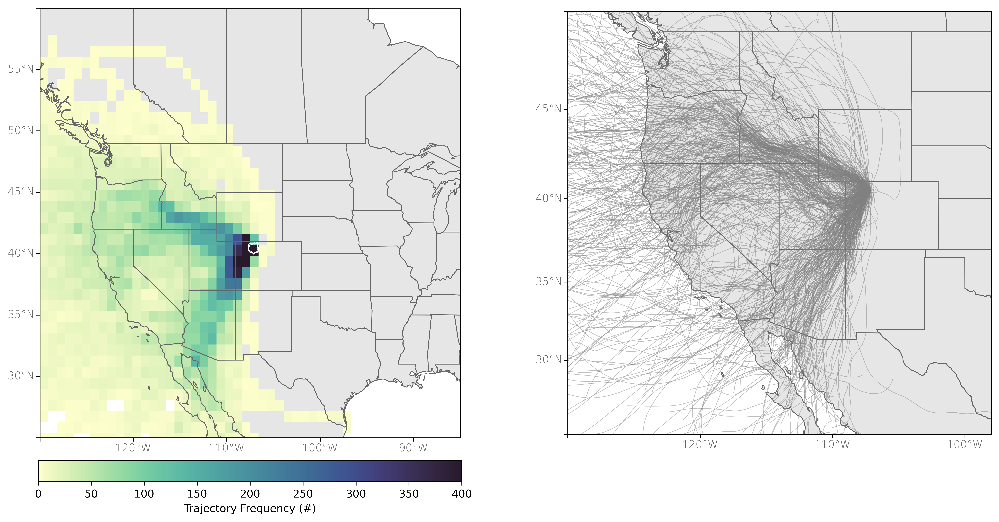

In [32]:
nrows = 2
ncols = 2

## Use gridspec to set up a plot with a series of subplots that is
## n-rows by n-columns
gs = GridSpec(nrows, ncols, height_ratios=[1, 0.05], width_ratios = [1, 1], wspace=0.25, hspace=0.1)
## use gs[rows index, columns index] to access grids

fig = plt.figure(figsize=(16.0, 8.0))
fig.dpi = 600
fname = path_to_figs + 'ARScale_trajectory_heatmaps_yesAR_Upper_Yampa'

#####################
### PLOT HEATMAPS ###
#####################
# Set up projection
datacrs = ccrs.PlateCarree()  ## the projection the data is in
mapcrs = ccrs.PlateCarree() ## the projection you want your map displayed in
ext = [-130., -85., 25., 60.] 
# Add color bar axis
cbax = plt.subplot(gs[1,0]) # colorbar axis

row_idx = [0]
col_idx = [0]
llat_lst = [True]
for i, cell in enumerate(cell_lst):
    ax = fig.add_subplot(gs[row_idx[i],col_idx[i]], projection=mapcrs)
    ax = draw_basemap(ax, extent=ext, xticks=dx, yticks=dy,left_lats=llat_lst[i], right_lats=False)
    

    ax.add_feature(cfeature.STATES, edgecolor='0.4', linewidth=0.8)
    
    ## plotting based off of https://geopandas.org/en/stable/docs/user_guide/mapping.html
    cf = cell.plot(ax=ax, column='n_traj', cmap=cmo.deep, vmin=0, vmax=400, edgecolor=None, legend=True, cax=cbax,
                  legend_kwds={"label": "Trajectory Frequency (#)", "orientation": "horizontal"})

    ## add in four focus watersheds
    polys.plot(ax=ax, edgecolor='white', color='None', zorder=99)

    ax.set_extent(ext, datacrs)

############################
### PLOT AR SCALE VALUES ###
############################
mapcrs = ccrs.Mercator()
ext = [-130., -98., 25., 50.] 
colors = ['#0ac1ff', '#04ff03', '#ffff03', '#ffa602', '#ff0100']

## OUTER LOOP - loop through different watersheds
# # need this to fix annotate transform
# transform = datacrs._as_mpl_transform(ax)

ax = fig.add_subplot(gs[0, 1], projection=mapcrs)
# ax.set_title(HUC8_lbls[k], loc='left', fontsize=14)
ax = draw_basemap(ax, extent=ext, xticks=dx, yticks=dy, left_lats=True, right_lats=False)
ax.set_extent(ext, datacrs)
ax.add_feature(cfeature.STATES, edgecolor='0.4', linewidth=0.8)
AR = ds.where(ds.ar_scale > 0, drop=True)
# need this to fix annotate transform
# transform = datacrs._as_mpl_transform(ax)
nevents = len(AR.start_date)
## Add different points
for i in range(nevents):
    data = AR.isel(start_date=i)
    y_lst = data.lat.values
    x_lst = data.lon.values
    z_lst = data.IVT.values
    ax.plot(x_lst, y_lst, c='gray', transform=datacrs, alpha=0.5, linewidth=0.5)
    cmap, norm, bnds = ccmaps.cmap('ivt')
    # cf = ax.scatter(x_lst, y_lst, c=z_lst, cmap=cmap, norm=norm, marker='.', transform=datacrs, alpha=0.8, s=6)

# # Add color bar
# cbarticks = [100, 200, 300, 500, 700, 1000, 1400, 1600]
# cbax = plt.subplot(gs[1,1]) # colorbar axis
# cb = Colorbar(ax = cbax, mappable = cf, orientation = 'horizontal', ticklocation = 'bottom')
# cb.set_label('IVT (kg m$^{-1}$ s$^{-1}$)', fontsize=11)
# cb.ax.tick_params(labelsize=12)
# ## INNER LOOP - Loop through AR scale values
# for j in range(1, 6):
#     try:
#         AR = ds.where(ds.ar_scale == j, drop=True)
#         nevents = len(AR.start_date)
#         print('j', j, nevents)
#         ## LOOP THROUGH TRAJECTORIES
#         for i in range(nevents):
#             data = AR.isel(start_date=i)
#             y_lst = data.lat.values
#             x_lst = data.lon.values
#             ax.plot(x_lst, y_lst, c=colors[j], transform=datacrs, alpha=0.2)
#             cf = ax.scatter(x_lst, y_lst, c=colors[j], marker='.', transform=datacrs, alpha=0.7, s=6)
#     except IndexError:
#         pass

# # # Add color bar
# cbax = plt.subplot(gs[1,-1]) # colorbar axis
# plot_arscale_cbar(cbax, orientation='horizontal')

fig.savefig('%s.%s' %(fname, fmt), bbox_inches='tight', dpi=fig.dpi, transparent=True)
plt.show()
fig.clf()